## DM-26087 Comparison of FFT and directly generated Fourier PSF in ZOGY

We go through step-by-step the calculation steps that is performed by ``ZogyImagePsfMatchTask.calculateFourierDiffim()``.

 * We repeat the same plots for the usual 31x31 PSF w/ padding
 * We test the generation of the PSF in frequency space directly (at the already padded size)
 * We test the FFT with large (1024x1024) PSF
 
 Only the direct generation is free from any frequency space irregularity and looks as we expect back in image space!

### Notation of calculated quantities

$c_1$, $c_2$: Matching kernels for the input images A, B.

$P_d$ : the PSF of the difference image, the result of the PSF matching for both images.

$P_s$ : the PSF of the score image

$\sigma_1$, $\sigma_2$: The PSF sigma (width) of Gaussian image PSFs in _image space_.

In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors
%run -b -i "2d_gaussian_in_freq_space.py"

In [2]:
from lsst.ip.diffim.zogy import ZogyTask, ZogyConfig
config = ZogyConfig()
config.scaleByCalibration = False
task = ZogyTask(config=config)

## 31x31 PSFs padded and FFTd
Pad a usual 31x31 pix. PSF then FFT them

In [3]:
A = calculate2dGaussianArray(31, 31, 3.3)
pA = task.padCenterOriginArray(A,(1024,1024))
psf1 = np.fft.fft2(pA)
B = calculate2dGaussianArray(31, 31, 2.2)
pB = task.padCenterOriginArray(B,(1024,1024))
psf2 = np.fft.fft2(pB)

<IPython.core.display.Javascript object>


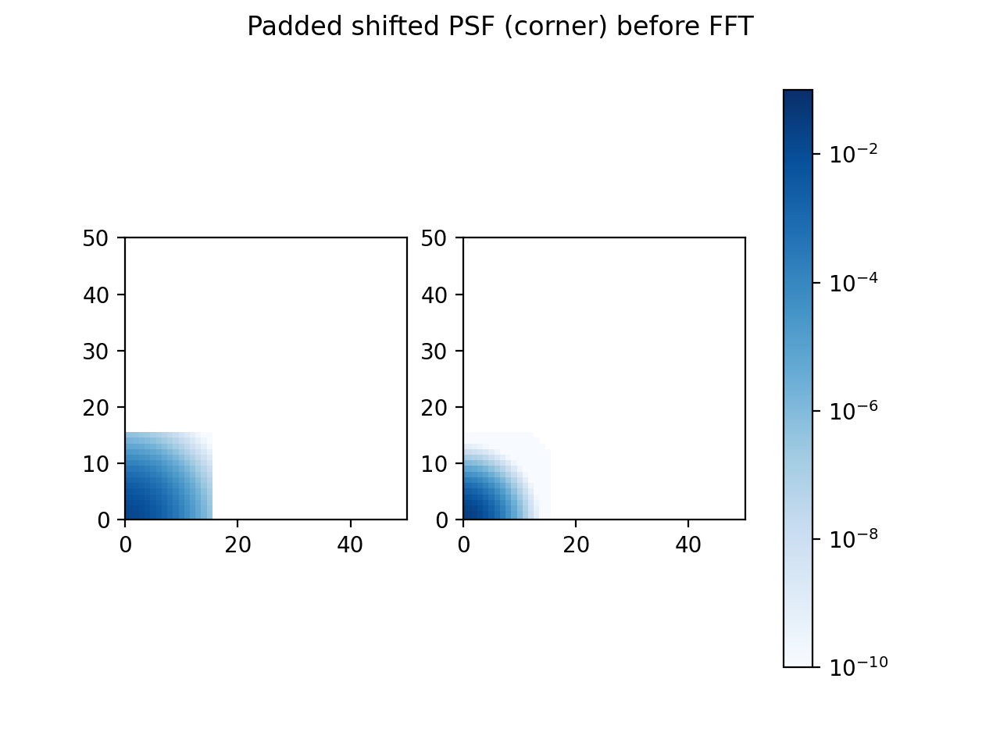

Text(0.5, 0.98, 'Padded shifted PSF (corner) before FFT')

In [4]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
cs = ax1.imshow(pA, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-10,vmax=0.1))
ax2 = fig.add_subplot(1, 2, 2)
cs = ax2.imshow(pB, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-10,vmax=0.1))
fig.colorbar(cs, ax=[ax1, ax2])
ax1.set_xlim(0, 50)
ax1.set_ylim(0, 50)
ax2.set_xlim(0, 50)
ax2.set_ylim(0, 50)
fig.suptitle("Padded shifted PSF (corner) before FFT")

<IPython.core.display.Javascript object>


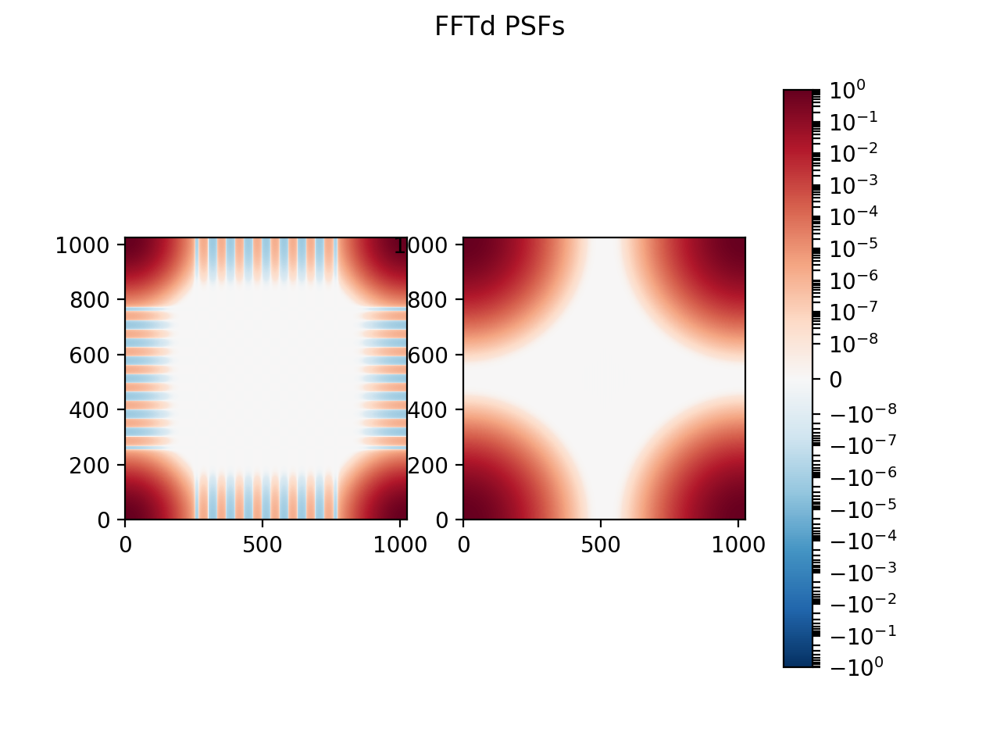

Text(0.5, 0.98, 'FFTd PSFs')

In [5]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
cs = ax1.imshow(psf1.real, origin='lower', interpolation='none',  cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-8,vmin=-1,vmax=1))
ax2 = fig.add_subplot(1, 2, 2)
cs = ax2.imshow(psf2.real, origin='lower', interpolation='none',  cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-8,vmin=-1,vmax=1))
fig.colorbar(cs, ax=[ax1, ax2])
fig.suptitle("FFTd PSFs")

There are some small negative values around in the frequency space PSFs.

In [6]:
# Noise variance in the images
varMean1 = 100
varMean2 = 100
F1 = 1.
F2 = 1. 
var1F2Sq = varMean1*F2*F2
var2F1Sq = varMean2*F1*F1
FdDenom = np.sqrt(var1F2Sq + var2F1Sq)  # one number
# We need reals for comparison, also real operations are usually faster
# Psf absolute squared
psfAbsSq1 = np.real(np.conj(psf1)*psf1)
psfAbsSq2 = np.real(np.conj(psf2)*psf2)
sDenom = var1F2Sq*psfAbsSq2 + var2F1Sq*psfAbsSq1  # array, eq. (12)
# sDenom close to zero check here in the code, here we ignore, we won't hit division by zero
denom = np.sqrt(sDenom)  # array, eq. (13)

sDenom: The squared denominator in the difference image calculation

<IPython.core.display.Javascript object>


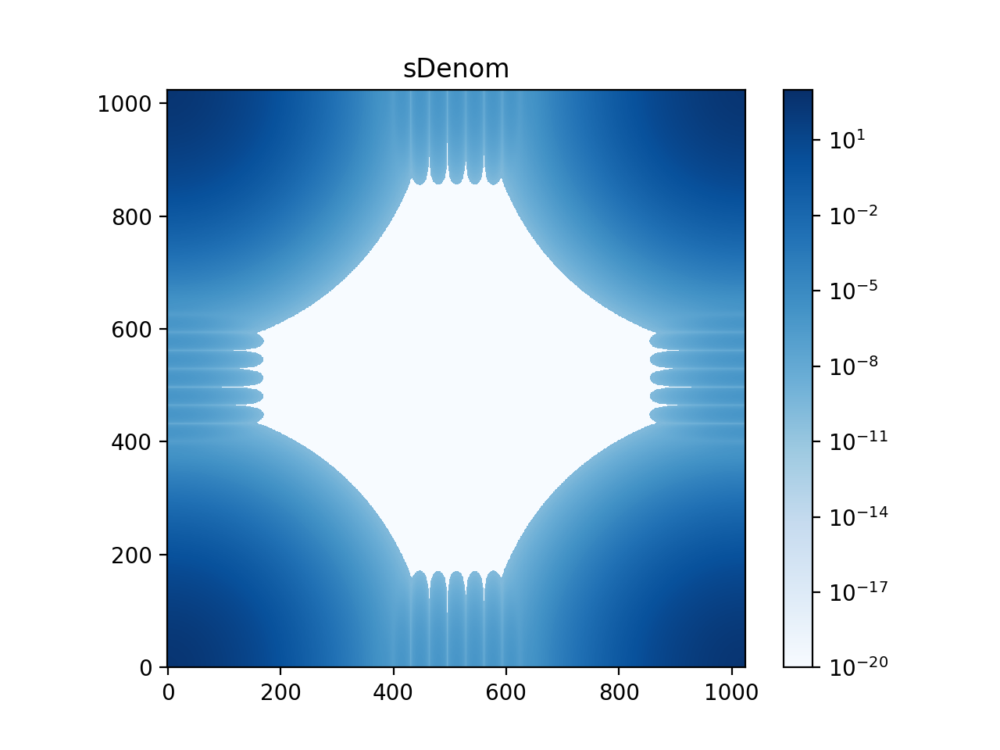

In [7]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(sDenom, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-20,vmax=1e3))
ax1.set_title("sDenom")
fig.colorbar(cs)

Note, the LogNorm cannot color more than 16 orders of magnitude correctly. Let's see the low value middle (high frequency region).

<IPython.core.display.Javascript object>


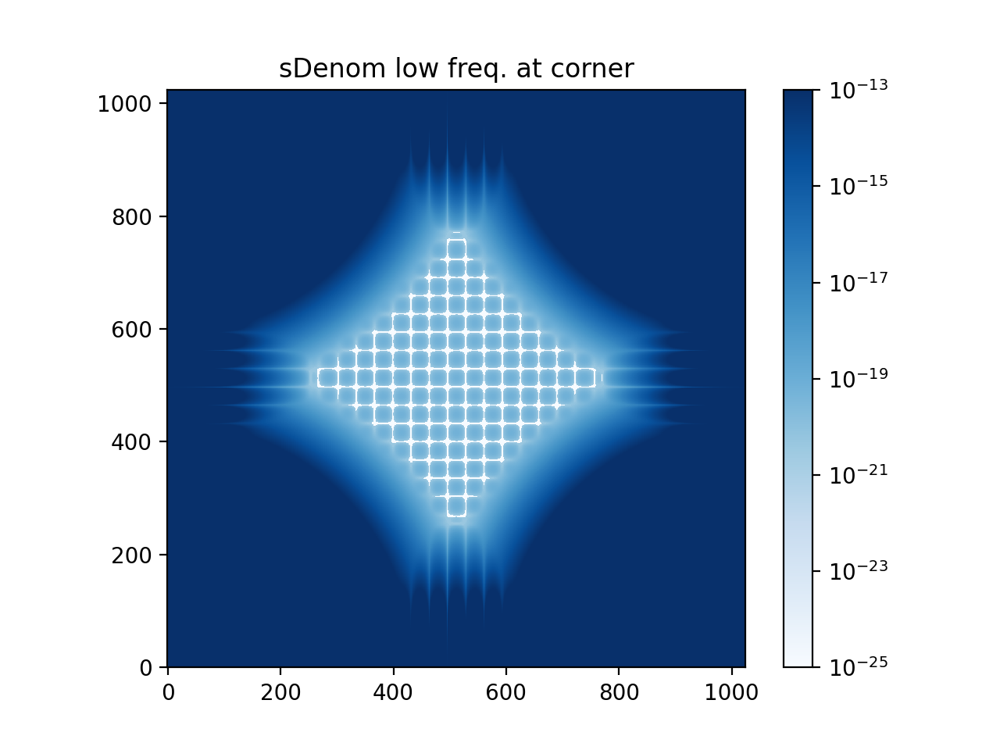

In [8]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(sDenom, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-25,vmax=1e-13))
ax1.set_title("sDenom low freq. at corner")
fig.colorbar(cs)

In [9]:
fPd = FdDenom*psf1*psf2/denom  # Psf of D eq. (14)
fc1 = psf2/denom
fc2 = psf1/denom

In [10]:
print(FdDenom)

14.142135623730951


Check all are real.

In [11]:
print(np.all(fPd.imag == 0), np.all(fc1.imag == 0), np.all(fc2.imag == 0))

True True True


<IPython.core.display.Javascript object>


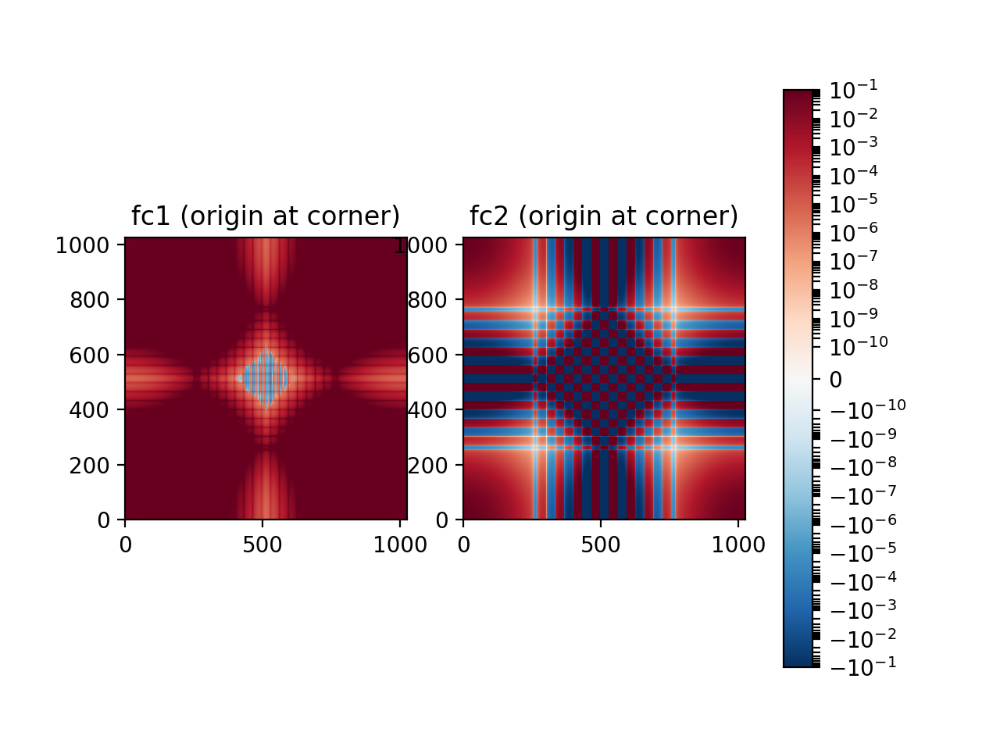

fc1 min -0.010198497229540712
fc1 max 0.10000000000000002
fc2 min -0.1
fc2 max 0.10000000000000002


In [12]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
cs = ax1.imshow(fc1.real, origin='lower', interpolation='none', cmap='RdBu_r',
                norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.1,vmax=0.1))
ax1.set_title("fc1 (origin at corner)")
ax2 = fig.add_subplot(1, 2, 2)
cs = ax2.imshow(fc2.real, origin='lower', interpolation='none', cmap='RdBu_r',
                norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.1,vmax=0.1))
ax2.set_title("fc2 (origin at corner)")
fig.colorbar(cs, ax=[ax1, ax2])
print(f"fc1 min {np.min(fc1.real)}")
print(f"fc1 max {np.max(fc1.real)}")
print(f"fc2 min {np.min(fc2.real)}")
print(f"fc2 max {np.max(fc1.real)}")

The matching kernel for the wider input PSF

<IPython.core.display.Javascript object>


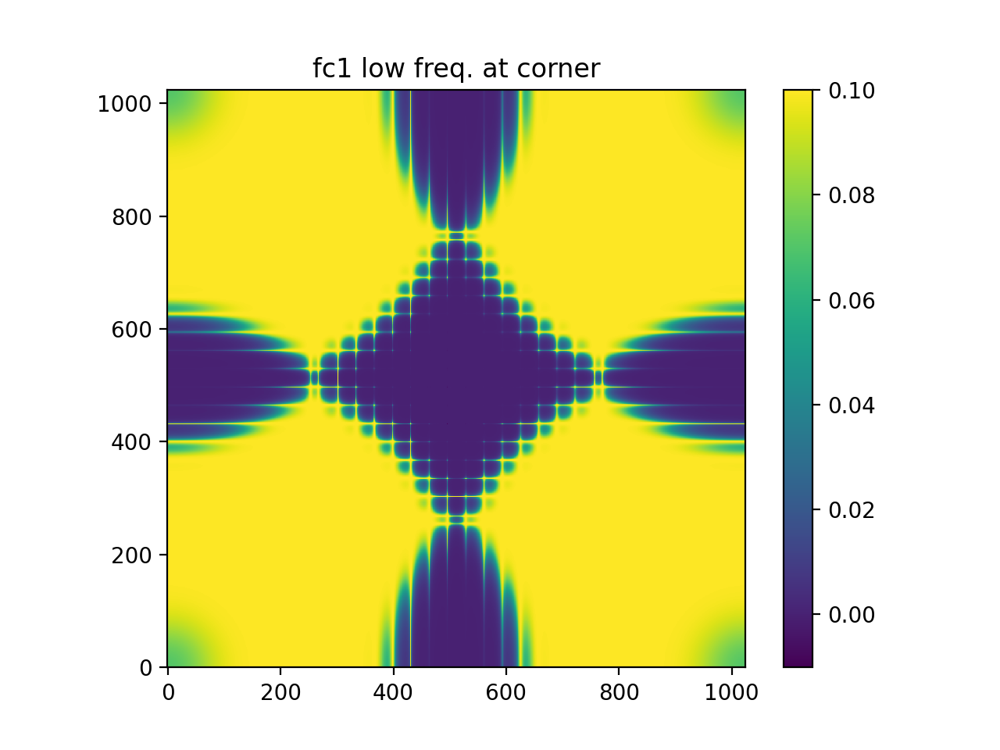

In [13]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(fc1.real, origin='lower', interpolation='none')
ax1.set_title("fc1 low freq. at corner")
fig.colorbar(cs)

In [14]:
fig.savefig("fft_steps_fc1.pdf")

The matching kernel for the narrower input PSF

<IPython.core.display.Javascript object>


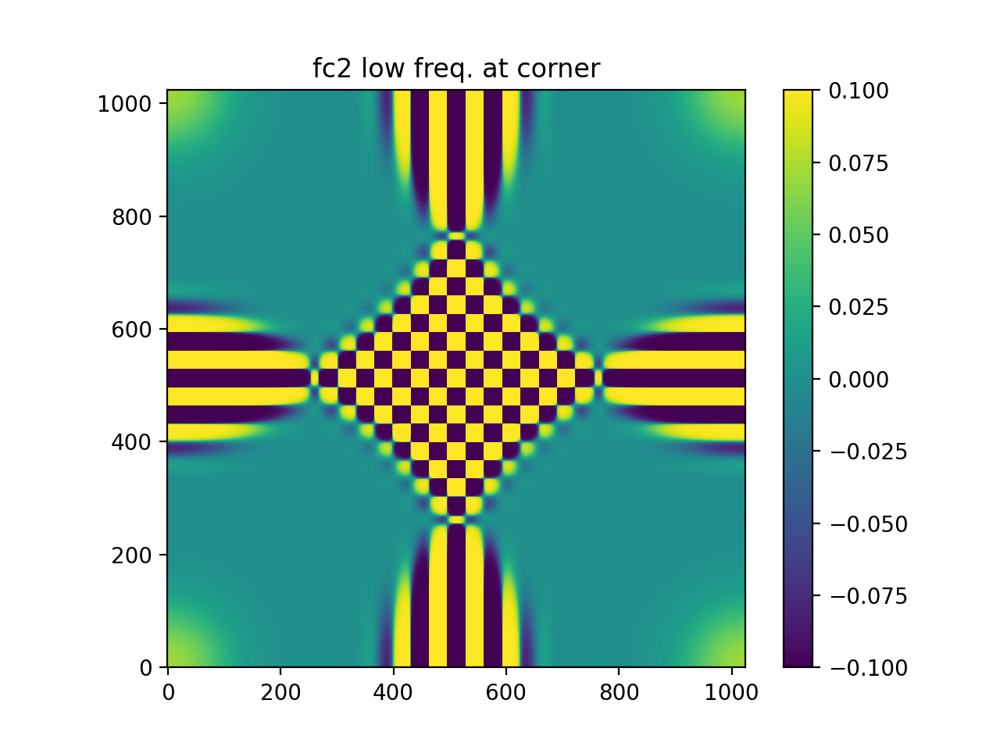

In [15]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(fc2.real, origin='lower', interpolation='none')
ax1.set_title("fc2 low freq. at corner")
fig.colorbar(cs)

In [16]:
fig.savefig("fft_steps_fc2.pdf")

In [17]:
Pd = np.real(np.fft.ifft2(fPd))
c1 = np.real(np.fft.ifft2(fc1))
c2 = np.real(np.fft.ifft2(fc2))

The matching kernel for the wider input back in image space

<IPython.core.display.Javascript object>


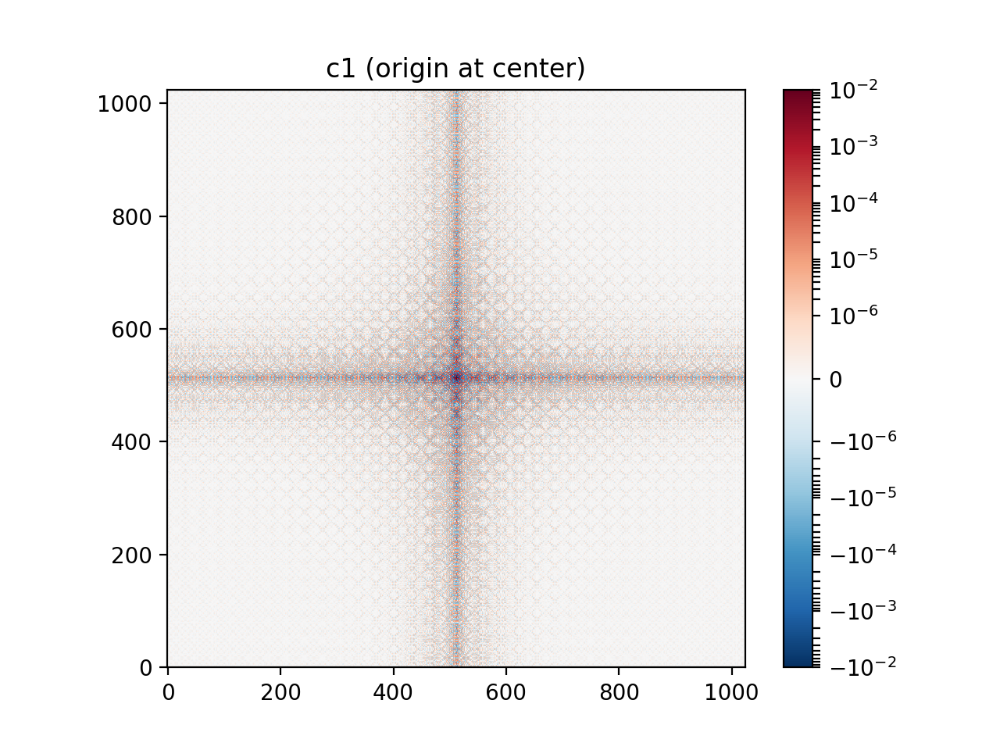

Text(0.5, 1.0, 'c1 (origin at center)')

In [18]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(c1, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_title("c1 (origin at center)")

And for the narrower one

<IPython.core.display.Javascript object>


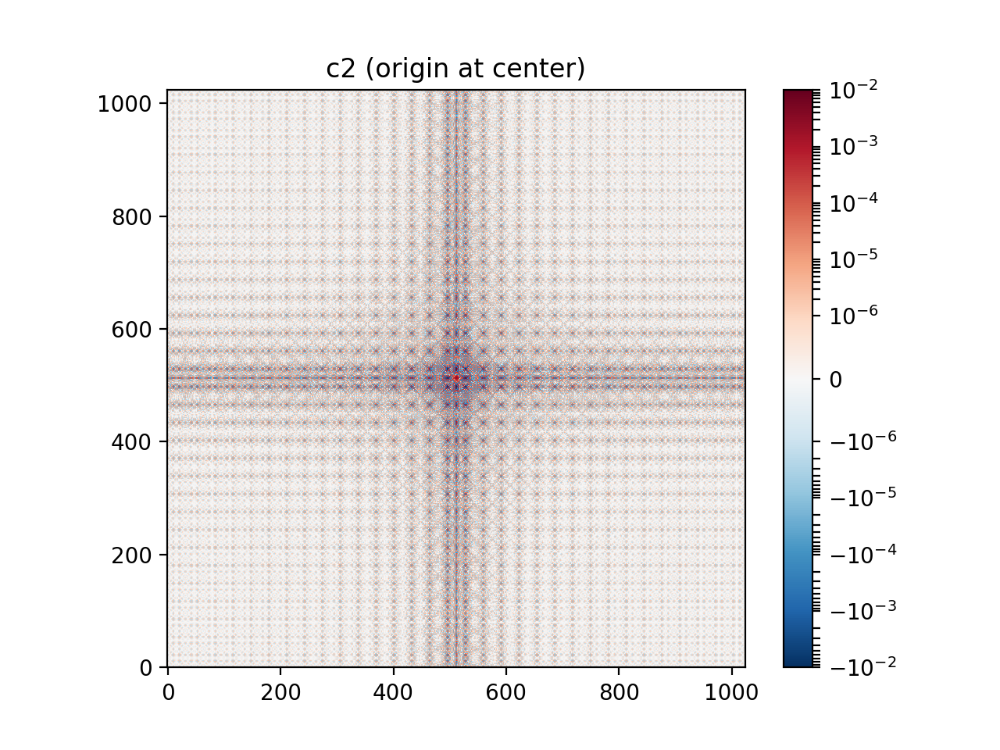

Text(0.5, 1.0, 'c2 (origin at center)')

In [19]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(c2, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_title("c2 (origin at center)")

PSF for the difference image

<IPython.core.display.Javascript object>


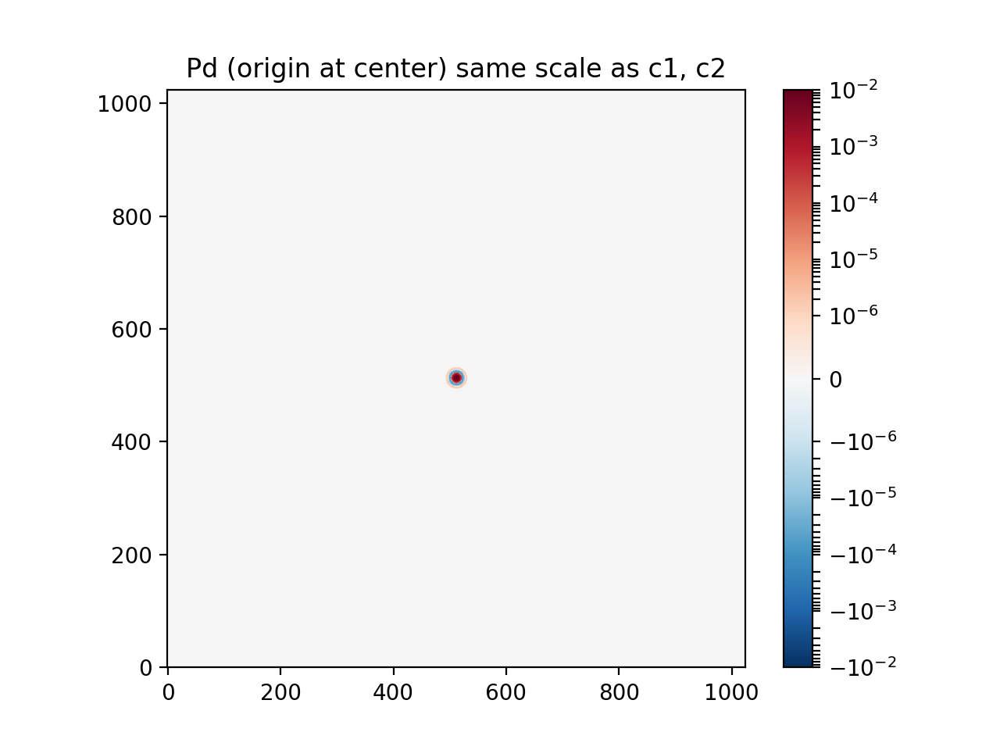

Text(0.5, 1.0, 'Pd (origin at center) same scale as c1, c2')

In [20]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(Pd, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_title("Pd (origin at center) same scale as c1, c2")

<IPython.core.display.Javascript object>


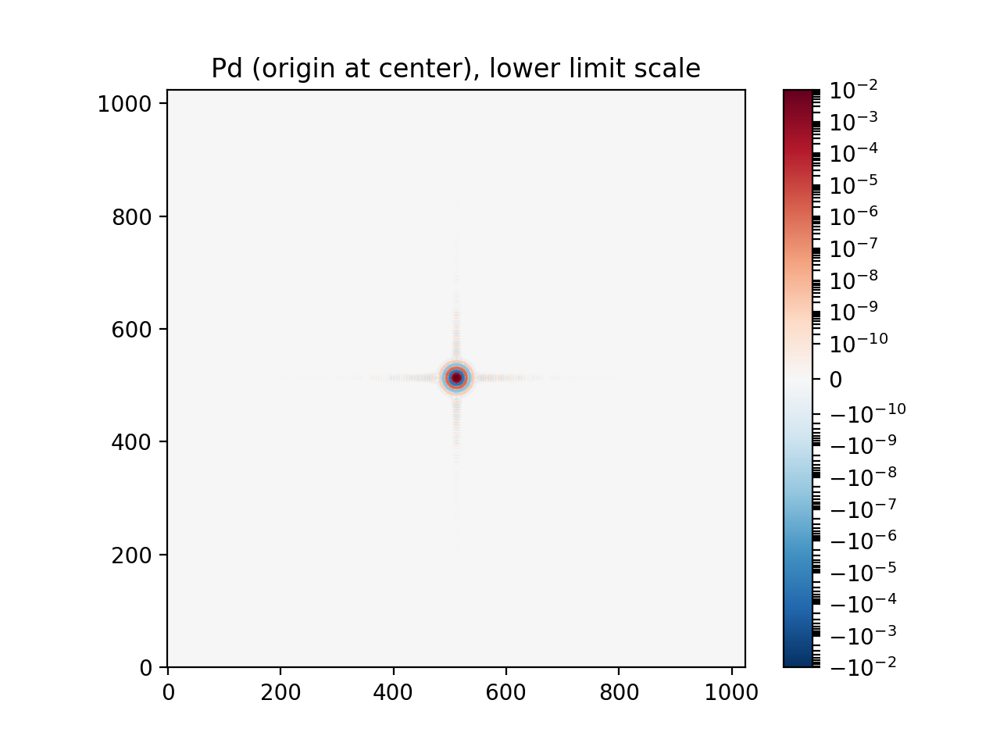

Text(0.5, 1.0, 'Pd (origin at center), lower limit scale')

In [21]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(Pd, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_title("Pd (origin at center), lower limit scale")

Pd is "one order more beautiful"

--------

## 1024x1024 directly generated fPSFs
Directly generate the PSFs in frequency space

In [22]:
pA = None
pB = None
psf1 = calculate2dGaussianArray(1024, 1024, 3.3, inFrequencySpace=True, fftShift=True)
psf2 = calculate2dGaussianArray(1024, 1024, 2.2, inFrequencySpace=True, fftShift=True)

<IPython.core.display.Javascript object>


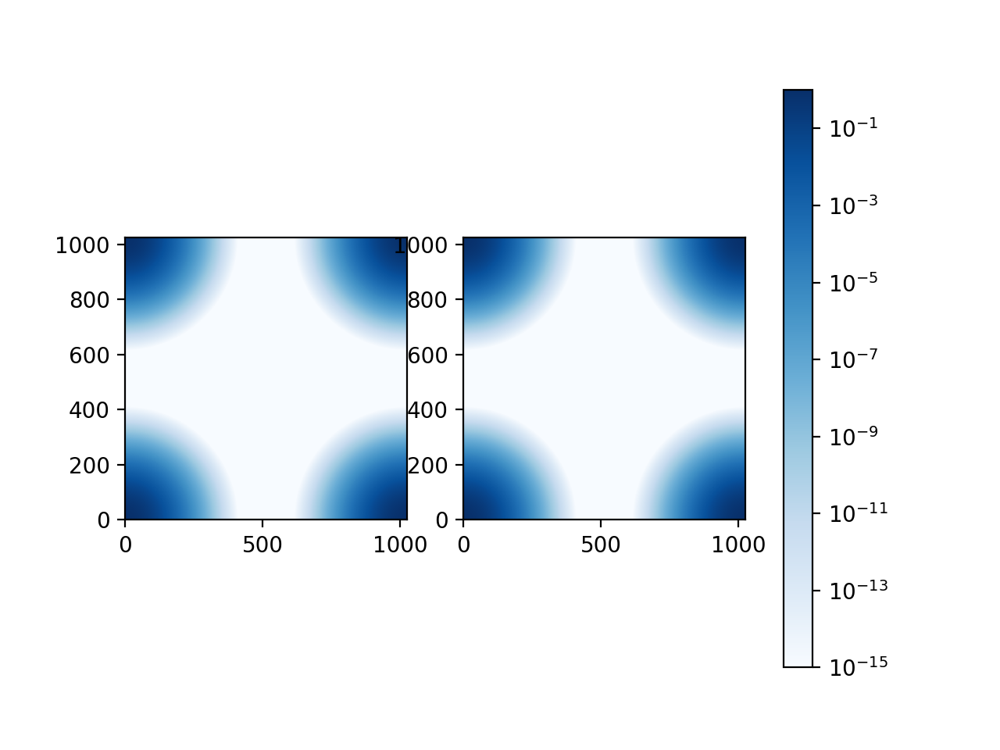

In [23]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
cs = ax1.imshow(psf1.real, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-15,vmax=1))
ax2 = fig.add_subplot(1, 2, 2)
cs = ax2.imshow(psf1.real, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-15,vmax=1))
fig.colorbar(cs, ax=[ax1, ax2])

In [24]:
# Noise variance in the images
varMean1 = 100
varMean2 = 100
F1 = 1.
F2 = 1. 
var1F2Sq = varMean1*F2*F2
var2F1Sq = varMean2*F1*F1
FdDenom = np.sqrt(var1F2Sq + var2F1Sq)  # one number
# We need reals for comparison, also real operations are usually faster
# Psf absolute squared
psfAbsSq1 = np.real(np.conj(psf1)*psf1)
psfAbsSq2 = np.real(np.conj(psf2)*psf2)
sDenom = var1F2Sq*psfAbsSq2 + var2F1Sq*psfAbsSq1  # array, eq. (12)
# sDenom close to zero check here in the code, here we ignore, we won't hit division by zero
denom = np.sqrt(sDenom)  # array, eq. (13)

<IPython.core.display.Javascript object>


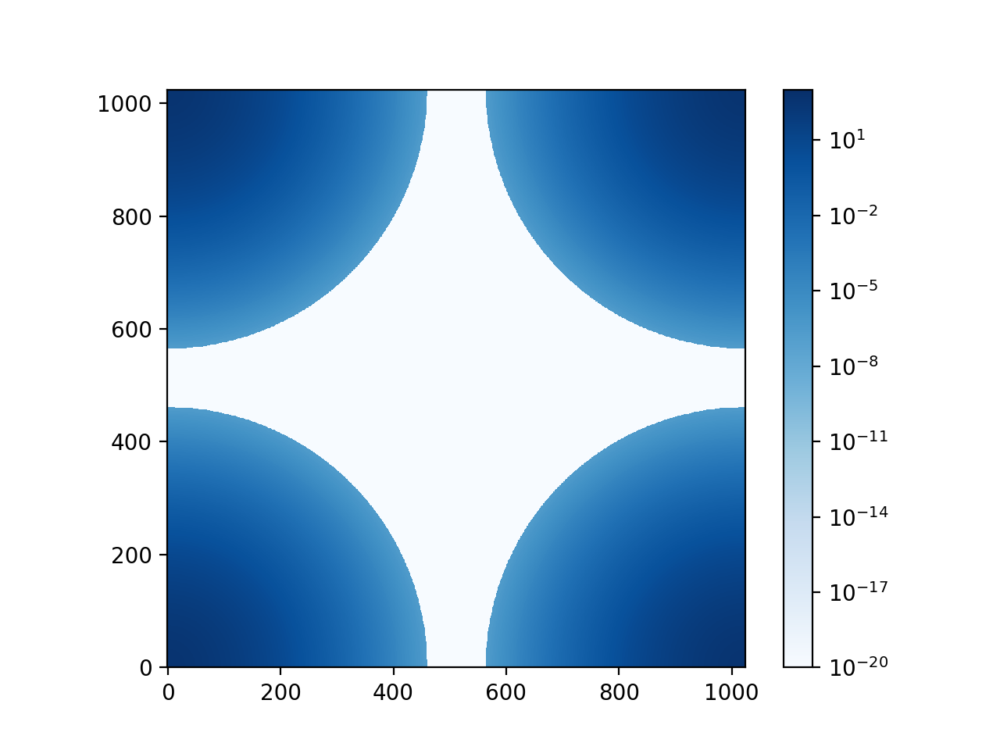

In [25]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(sDenom, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-20,vmax=1e3))
fig.colorbar(cs)

Note, the LogNorm cannot color more than 16 orders of magnitude correctly. Let's see the low value middle (high frequency region).

<IPython.core.display.Javascript object>


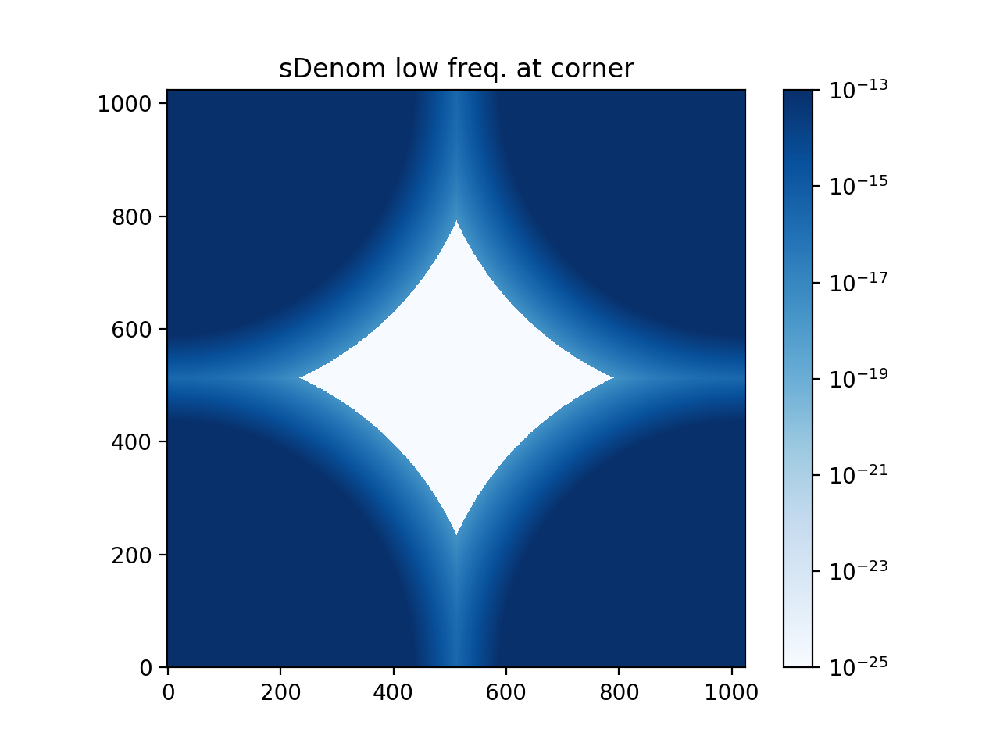

In [26]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(sDenom, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-25,vmax=1e-13))
ax1.set_title("sDenom low freq. at corner")
fig.colorbar(cs)

In [27]:
fPd = FdDenom*psf1*psf2/denom  # Psf of D eq. (14)
fc1 = psf2/denom
fc2 = psf1/denom

In [28]:
print(FdDenom)

14.142135623730951


Check all are real.

In [29]:
print(np.all(fPd.imag == 0), np.all(fc1.imag == 0), np.all(fc2.imag == 0))

True True True


<IPython.core.display.Javascript object>


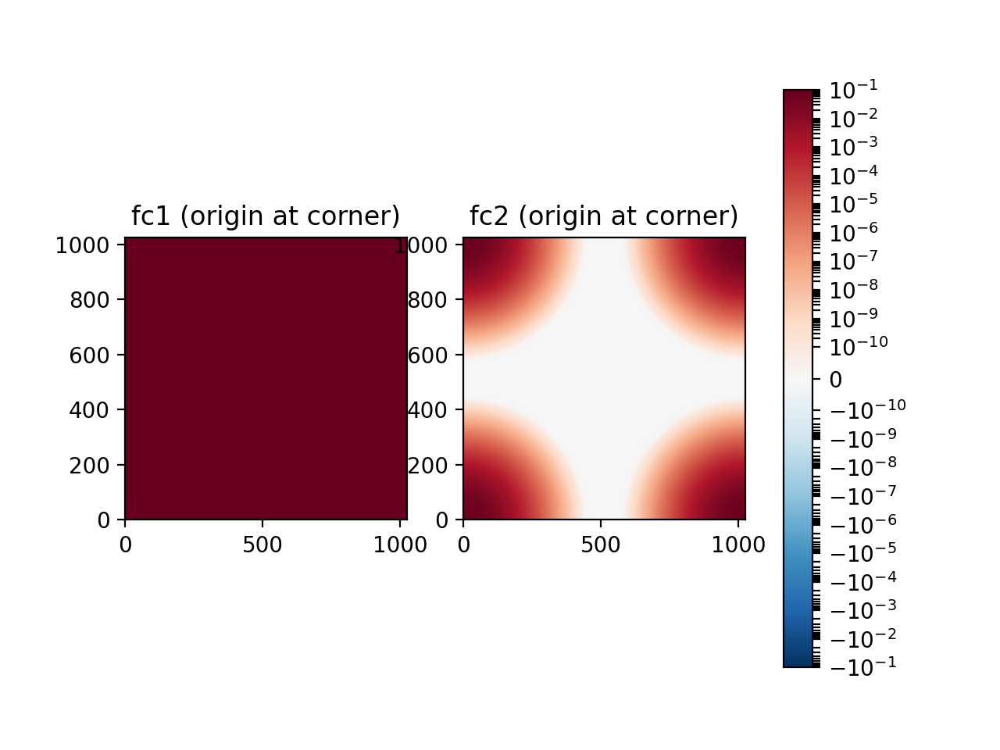

fc1 min 0.07071067811865475
fc1 max 0.10000000000000002
fc2 min 1.1689498612211409e-27
fc2 max 0.10000000000000002


In [30]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
cs = ax1.imshow(fc1.real, origin='lower', interpolation='none', cmap='RdBu_r',
                norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.1,vmax=0.1))
ax1.set_title("fc1 (origin at corner)")
ax2 = fig.add_subplot(1, 2, 2)
cs = ax2.imshow(fc2.real, origin='lower', interpolation='none', cmap='RdBu_r',
                norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.1,vmax=0.1))
ax2.set_title("fc2 (origin at corner)")
fig.colorbar(cs, ax=[ax1, ax2])
print(f"fc1 min {np.min(fc1.real)}")
print(f"fc1 max {np.max(fc1.real)}")
print(f"fc2 min {np.min(fc2.real)}")
print(f"fc2 max {np.max(fc1.real)}")

<IPython.core.display.Javascript object>


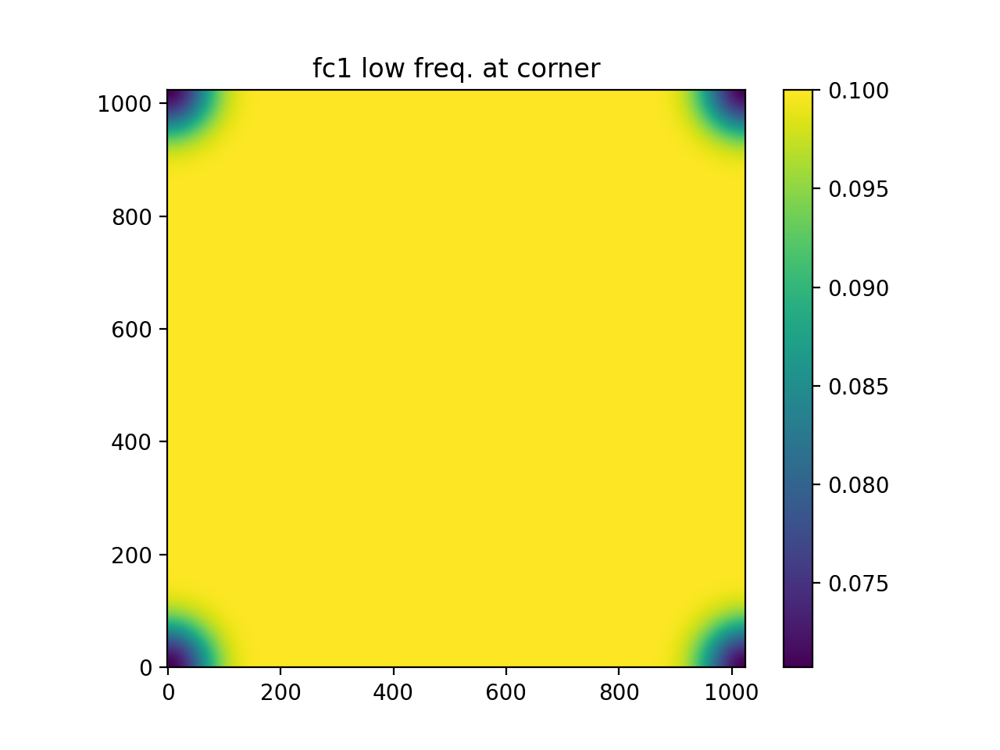

In [31]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(fc1.real, origin='lower', interpolation='none')
ax1.set_title("fc1 low freq. at corner")
fig.colorbar(cs)

In [32]:
fig.savefig("fft_steps_direct_fc1.pdf")

<IPython.core.display.Javascript object>


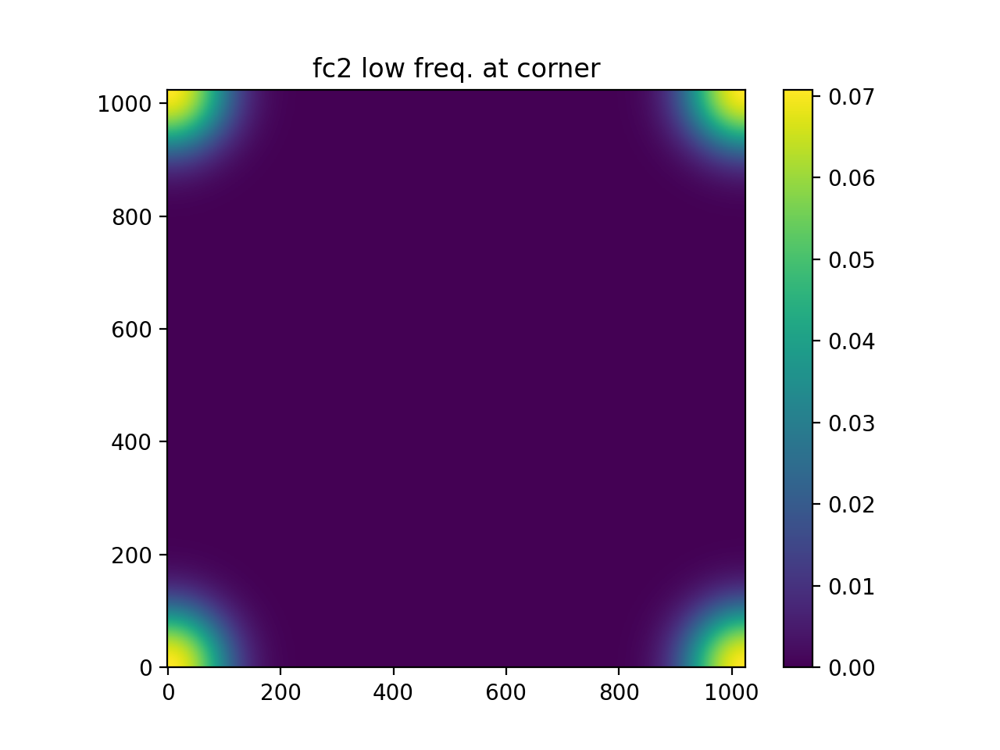

In [33]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(fc2.real, origin='lower', interpolation='none')
ax1.set_title("fc2 low freq. at corner")
fig.colorbar(cs)

In [34]:
fig.savefig("fft_steps_direct_fc2.pdf")

In [35]:
Pd = np.real(np.fft.ifft2(fPd))
c1 = np.real(np.fft.ifft2(fc1))
c2 = np.real(np.fft.ifft2(fc2))

<IPython.core.display.Javascript object>


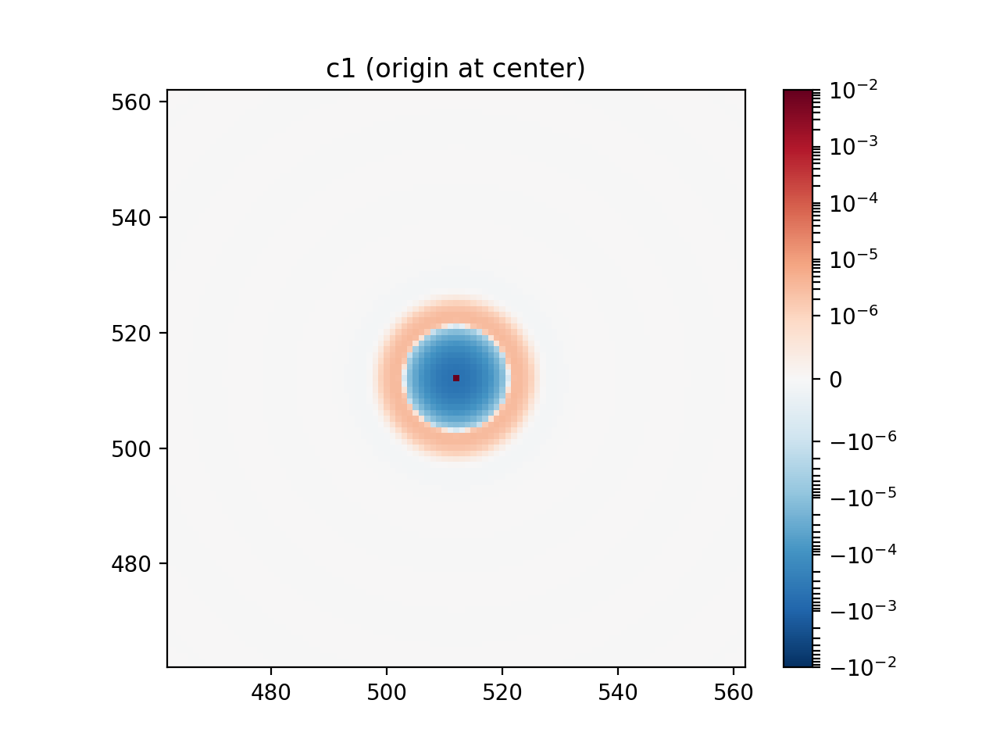

Text(0.5, 1.0, 'c1 (origin at center)')

In [36]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(c1, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_xlim(462, 562)
ax.set_ylim(462, 562)
ax.set_title("c1 (origin at center)")

In [37]:
fig.savefig("fft_steps_direct_c1_zoomed.pdf")

<IPython.core.display.Javascript object>


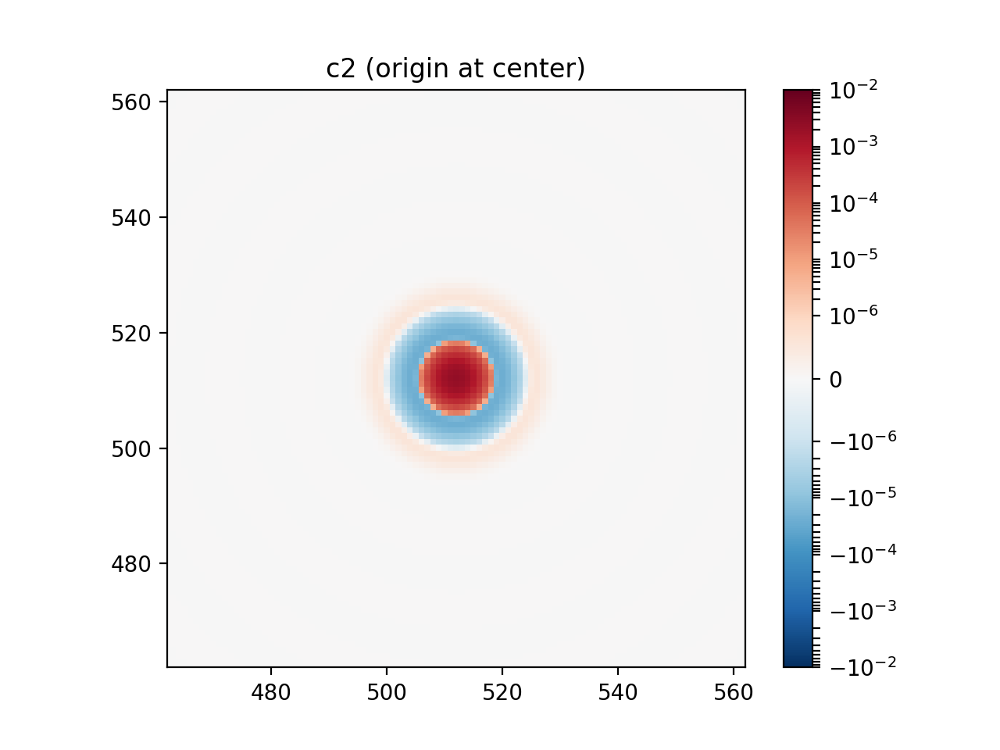

Text(0.5, 1.0, 'c2 (origin at center)')

In [38]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(c2, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_xlim(462, 562)
ax.set_ylim(462, 562)
ax.set_title("c2 (origin at center)")

In [39]:
fig.savefig("fft_steps_direct_c2_zoomed.pdf")

<IPython.core.display.Javascript object>


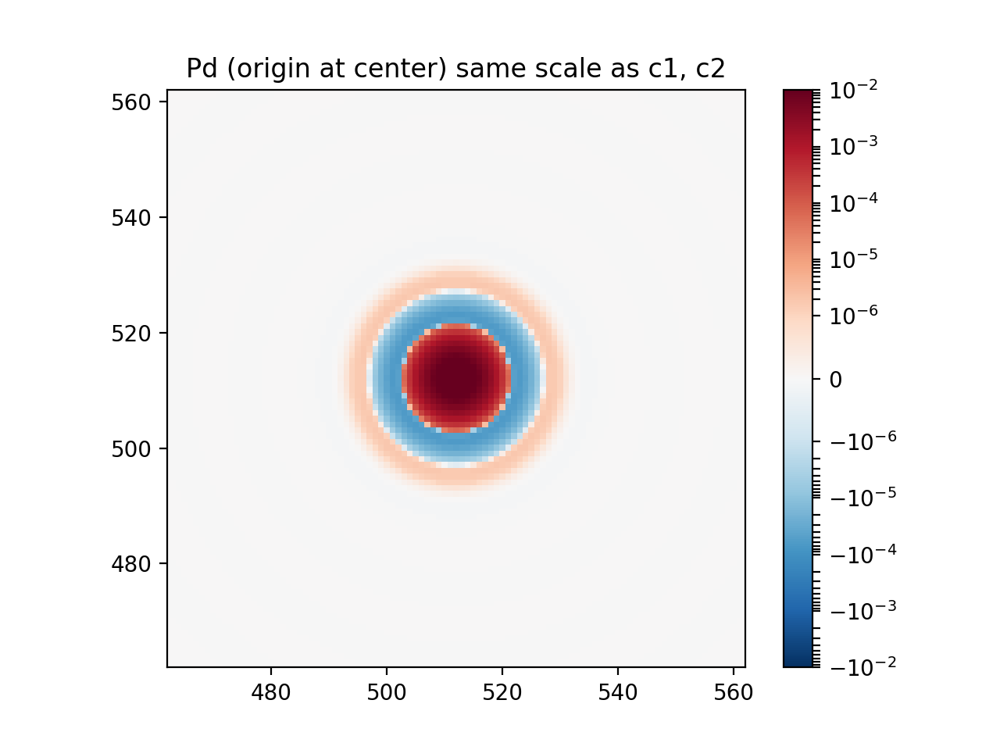

Text(0.5, 1.0, 'Pd (origin at center) same scale as c1, c2')

In [40]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(Pd, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_xlim(462, 562)
ax.set_ylim(462, 562)
ax.set_title("Pd (origin at center) same scale as c1, c2")

In [41]:
fig.savefig("fft_steps_direct_Pd_zoomed.pdf")

<ipython-input-42-bf388a427de7>:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


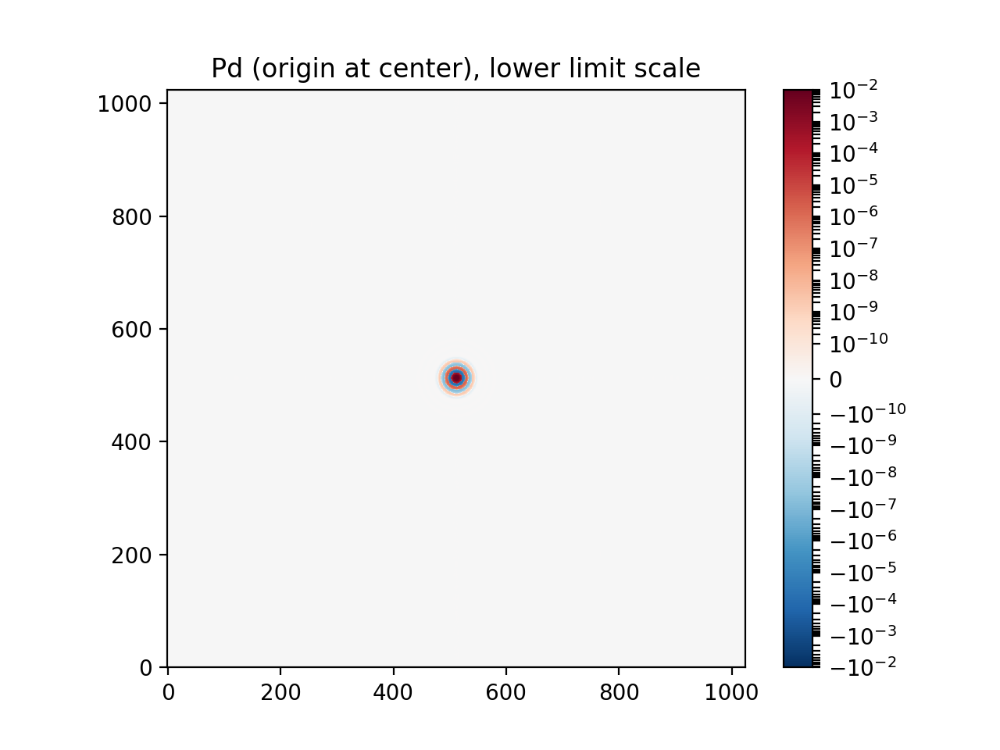

Text(0.5, 1.0, 'Pd (origin at center), lower limit scale')

In [42]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(Pd, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_title("Pd (origin at center), lower limit scale")

## 1024x1024 PSF with FFT
Generate PSF in 1024x1024 padded version then FFT them

In [43]:
pA = calculate2dGaussianArray(1024, 1024, 3.3, fftShift=True)
#pA = task.padCenterOriginArray(A,(1024,1024))
psf1 = np.fft.fft2(pA)
pB = calculate2dGaussianArray(1024, 1024, 2.2, fftShift=True)
#pB = task.padCenterOriginArray(B,(1024,1024))
psf2 = np.fft.fft2(pB)

<IPython.core.display.Javascript object>


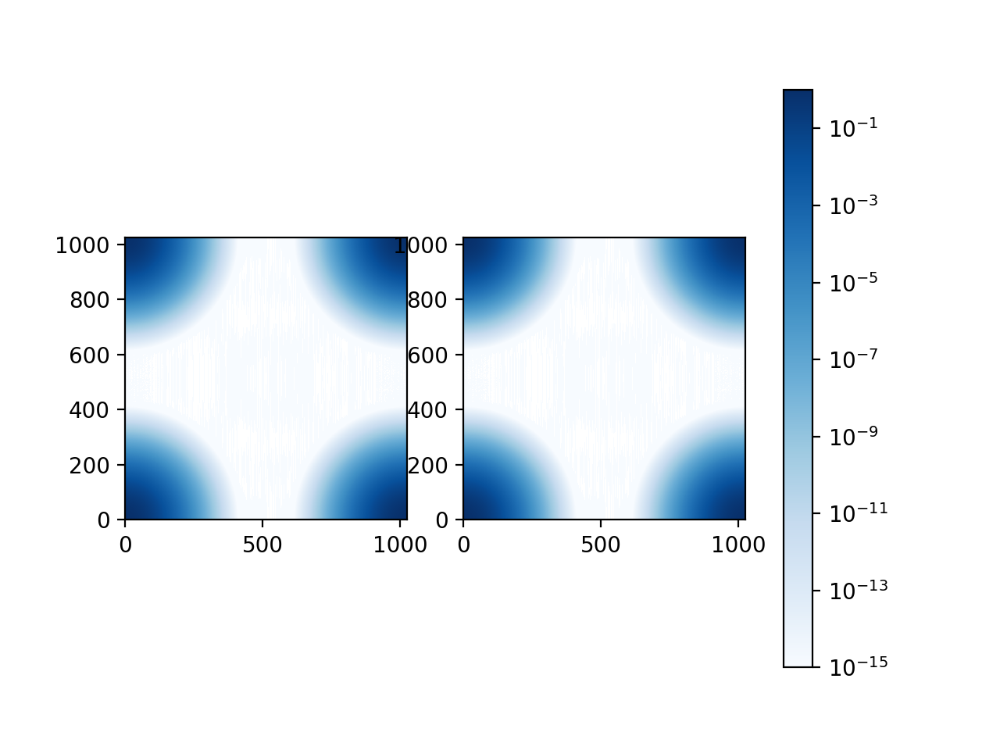

In [44]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
cs = ax1.imshow(psf1.real, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-15,vmax=1))
ax2 = fig.add_subplot(1, 2, 2)
cs = ax2.imshow(psf1.real, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-15,vmax=1))
fig.colorbar(cs, ax=[ax1, ax2])

In [45]:
# Noise variance in the images
varMean1 = 100
varMean2 = 100
F1 = 1.
F2 = 1. 
var1F2Sq = varMean1*F2*F2
var2F1Sq = varMean2*F1*F1
FdDenom = np.sqrt(var1F2Sq + var2F1Sq)  # one number
# We need reals for comparison, also real operations are usually faster
# Psf absolute squared
psfAbsSq1 = np.real(np.conj(psf1)*psf1)
psfAbsSq2 = np.real(np.conj(psf2)*psf2)
sDenom = var1F2Sq*psfAbsSq2 + var2F1Sq*psfAbsSq1  # array, eq. (12)
# sDenom close to zero check here in the code, here we ignore, we won't hit division by zero
denom = np.sqrt(sDenom)  # array, eq. (13)

<IPython.core.display.Javascript object>


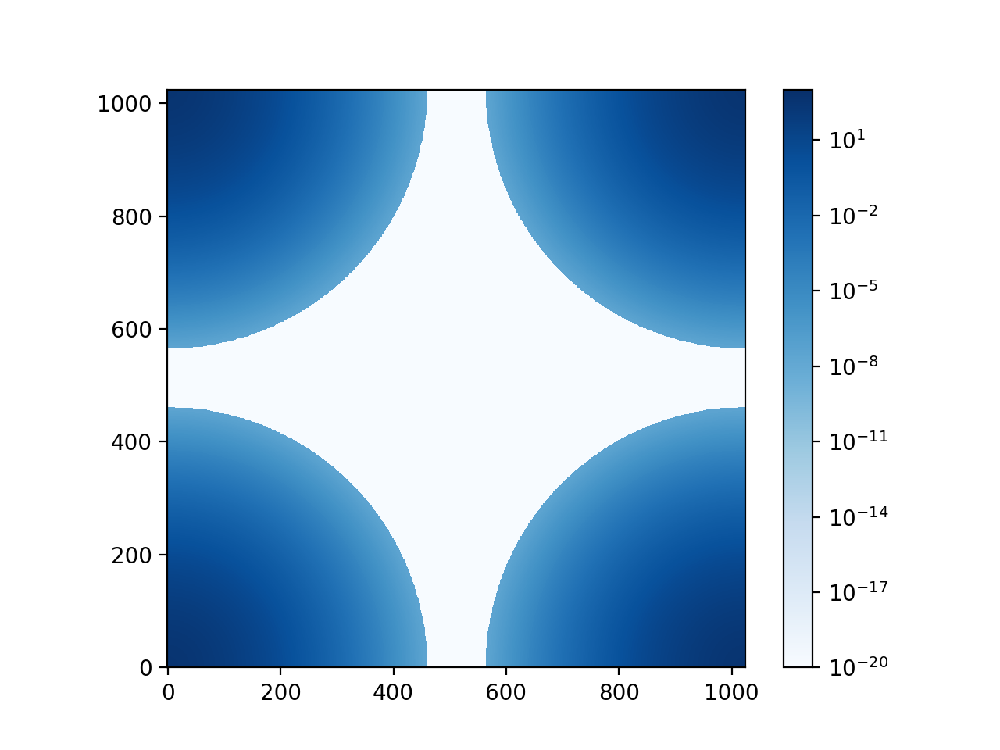

In [46]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(sDenom, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-20,vmax=1e3))
fig.colorbar(cs)

Note, the LogNorm cannot color more than 16 orders of magnitude correctly. Let's see the low value middle (high frequency region).

<IPython.core.display.Javascript object>


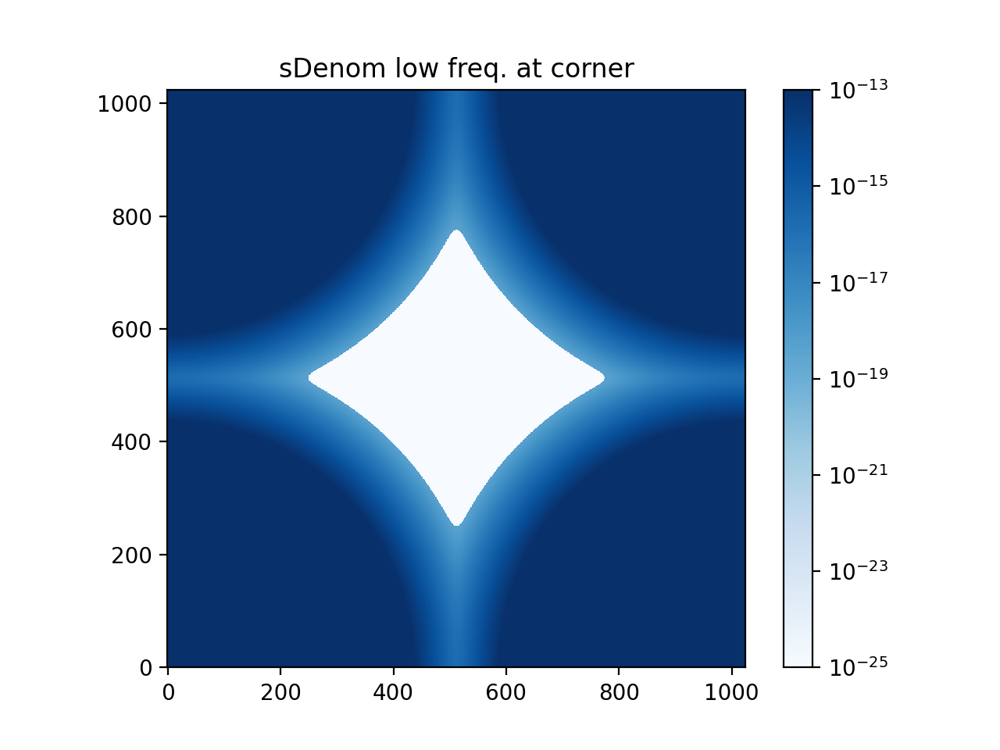

In [47]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(sDenom, origin='lower', interpolation='none',  cmap='Blues',
               norm=matplotlib.colors.LogNorm(vmin=1e-25,vmax=1e-13))
ax1.set_title("sDenom low freq. at corner")
fig.colorbar(cs)

In [48]:
fPd = FdDenom*psf1*psf2/denom  # Psf of D eq. (14)
fc1 = psf2/denom
fc2 = psf1/denom

In [49]:
print(FdDenom)

14.142135623730951


Check all are real.

In [50]:
print(np.all(fPd.imag == 0), np.all(fc1.imag == 0), np.all(fc2.imag == 0))

True True True


<IPython.core.display.Javascript object>


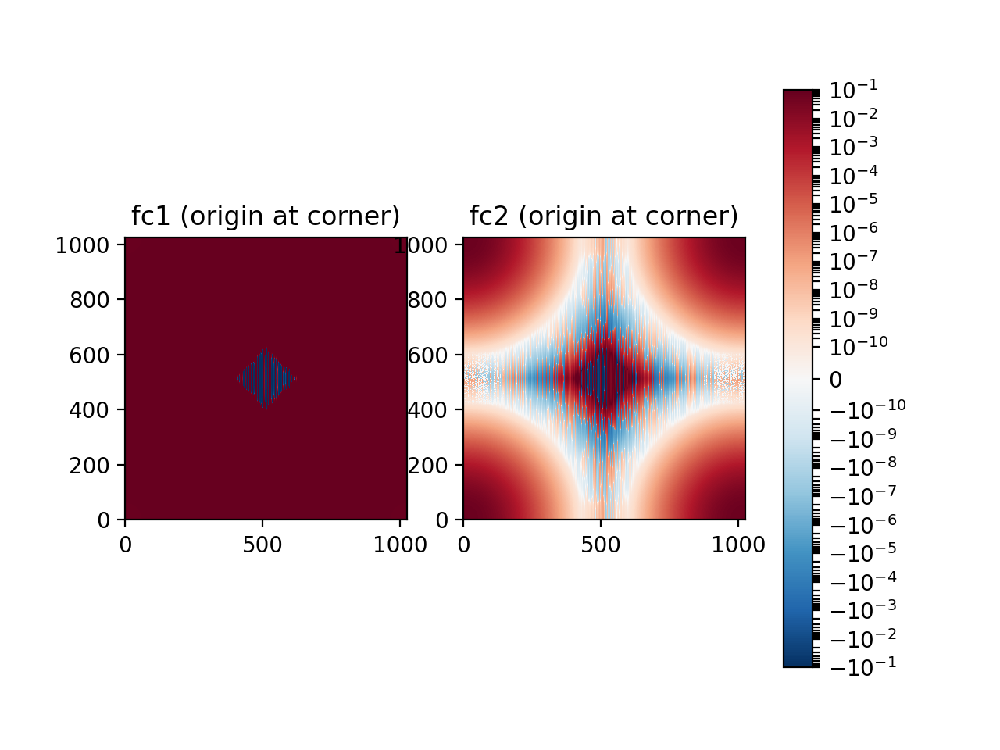

fc1 min -0.09999999869892655
fc1 max 0.10000000000000002
fc2 min -0.0999999834213366
fc2 max 0.10000000000000002


In [51]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
cs = ax1.imshow(fc1.real, origin='lower', interpolation='none', cmap='RdBu_r',
                norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.1,vmax=0.1))
ax1.set_title("fc1 (origin at corner)")
ax2 = fig.add_subplot(1, 2, 2)
cs = ax2.imshow(fc2.real, origin='lower', interpolation='none', cmap='RdBu_r',
                norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.1,vmax=0.1))
ax2.set_title("fc2 (origin at corner)")
fig.colorbar(cs, ax=[ax1, ax2])
print(f"fc1 min {np.min(fc1.real)}")
print(f"fc1 max {np.max(fc1.real)}")
print(f"fc2 min {np.min(fc2.real)}")
print(f"fc2 max {np.max(fc1.real)}")

<IPython.core.display.Javascript object>


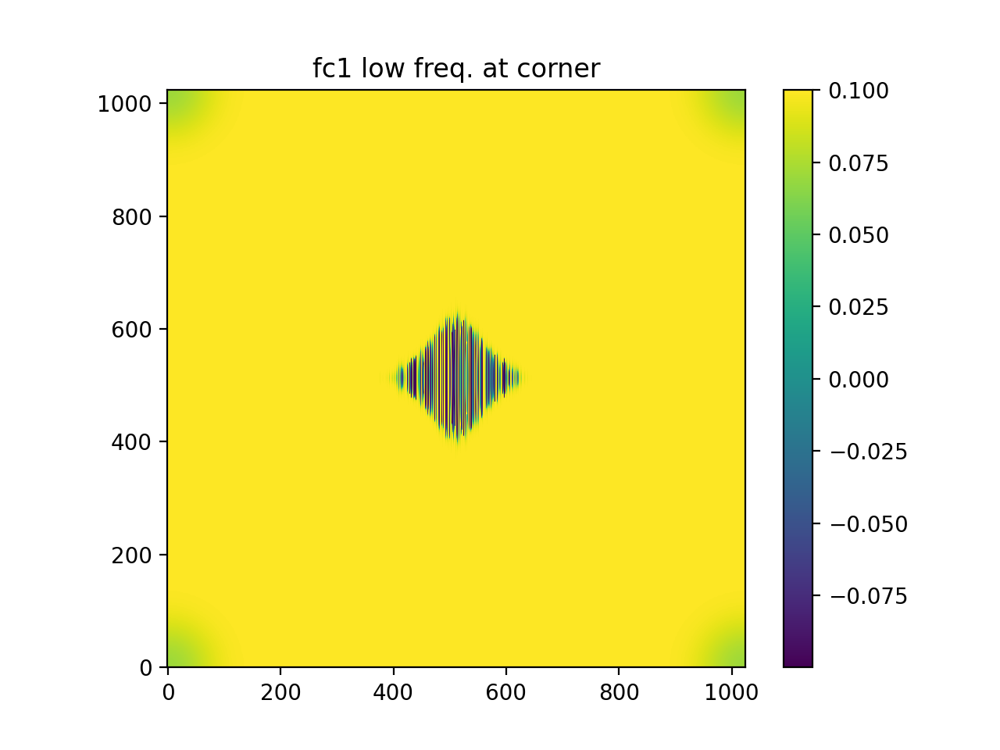

In [52]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(fc1.real, origin='lower', interpolation='none')
ax1.set_title("fc1 low freq. at corner")
fig.colorbar(cs)

<IPython.core.display.Javascript object>


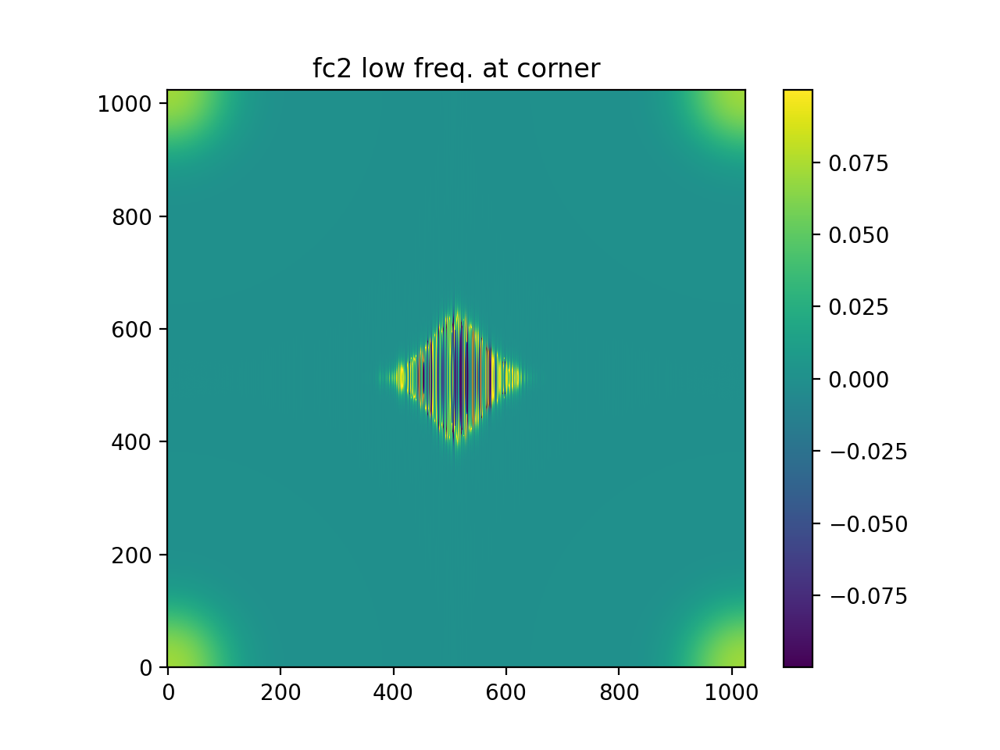

In [53]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
cs = ax1.imshow(fc2.real, origin='lower', interpolation='none')
ax1.set_title("fc2 low freq. at corner")
fig.colorbar(cs)

In [54]:
Pd = np.real(np.fft.ifft2(fPd))
c1 = np.real(np.fft.ifft2(fc1))
c2 = np.real(np.fft.ifft2(fc2))

<IPython.core.display.Javascript object>


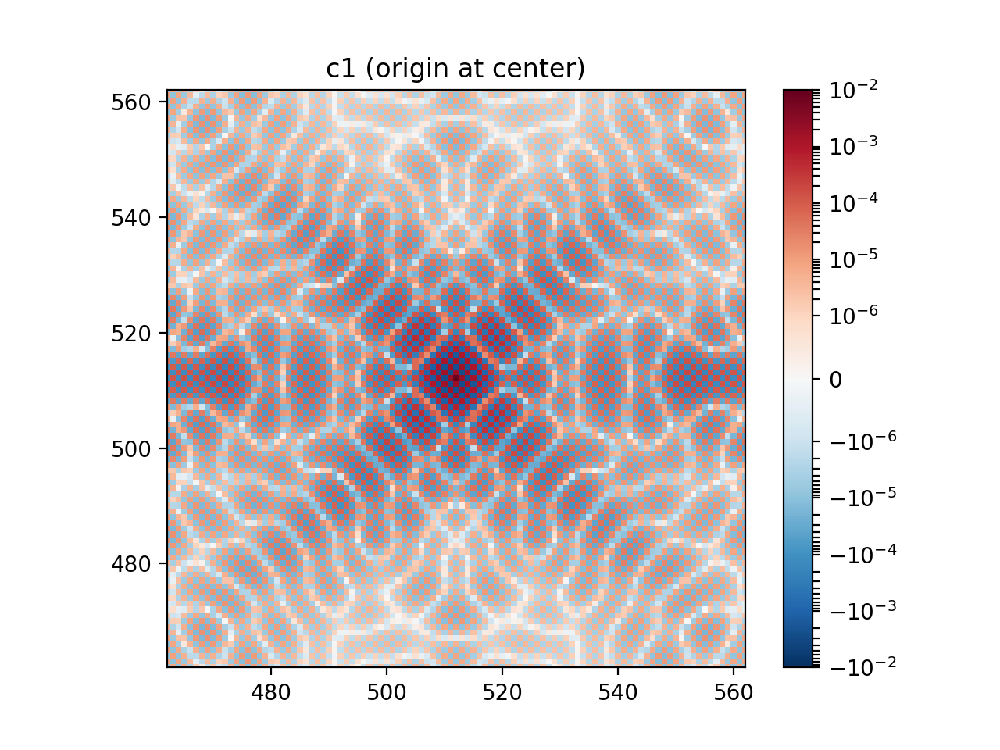

Text(0.5, 1.0, 'c1 (origin at center)')

In [55]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(c1, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_xlim(462, 562)
ax.set_ylim(462, 562)
ax.set_title("c1 (origin at center)")

<IPython.core.display.Javascript object>


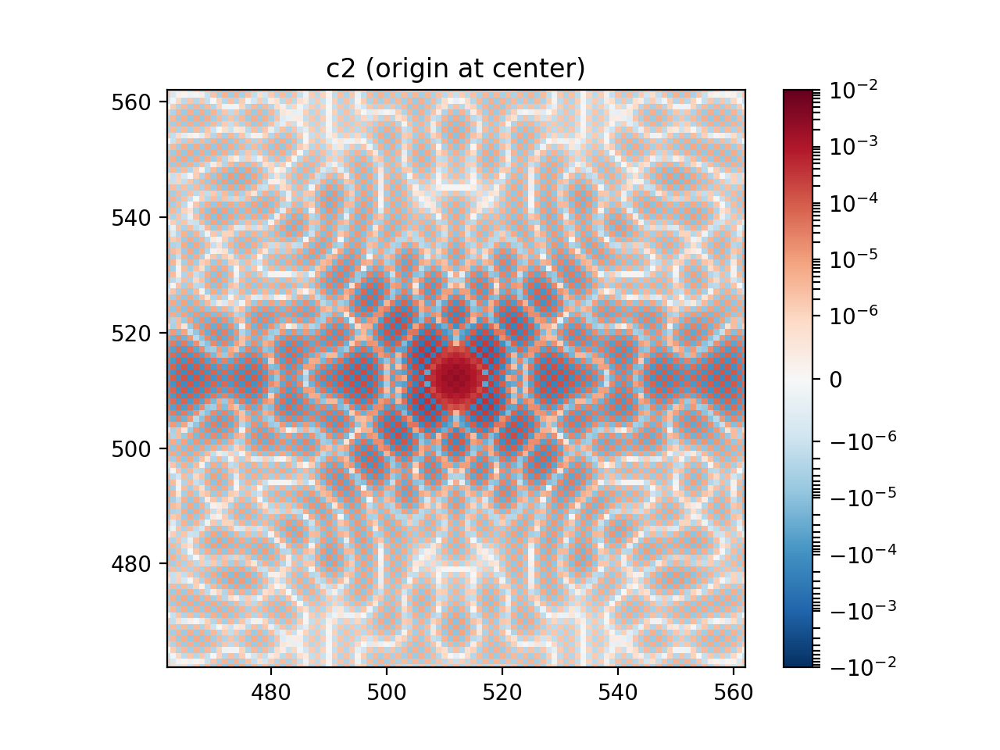

Text(0.5, 1.0, 'c2 (origin at center)')

In [56]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(c2, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_xlim(462, 562)
ax.set_ylim(462, 562)
ax.set_title("c2 (origin at center)")

<IPython.core.display.Javascript object>


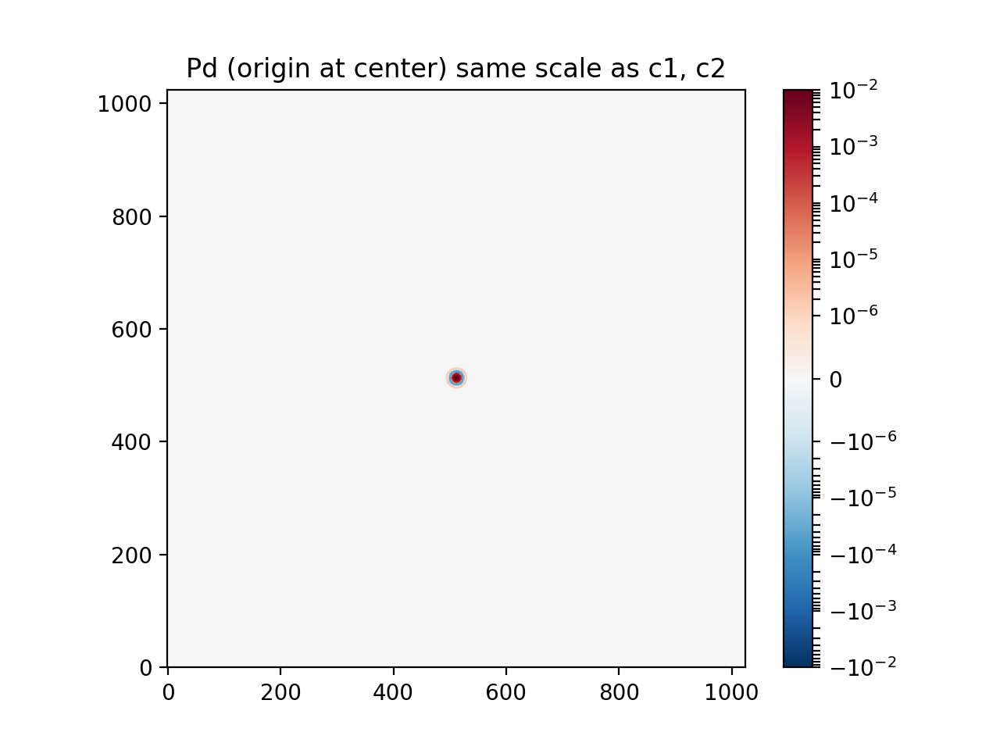

Text(0.5, 1.0, 'Pd (origin at center) same scale as c1, c2')

In [57]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(Pd, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-6,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_title("Pd (origin at center) same scale as c1, c2")

<IPython.core.display.Javascript object>


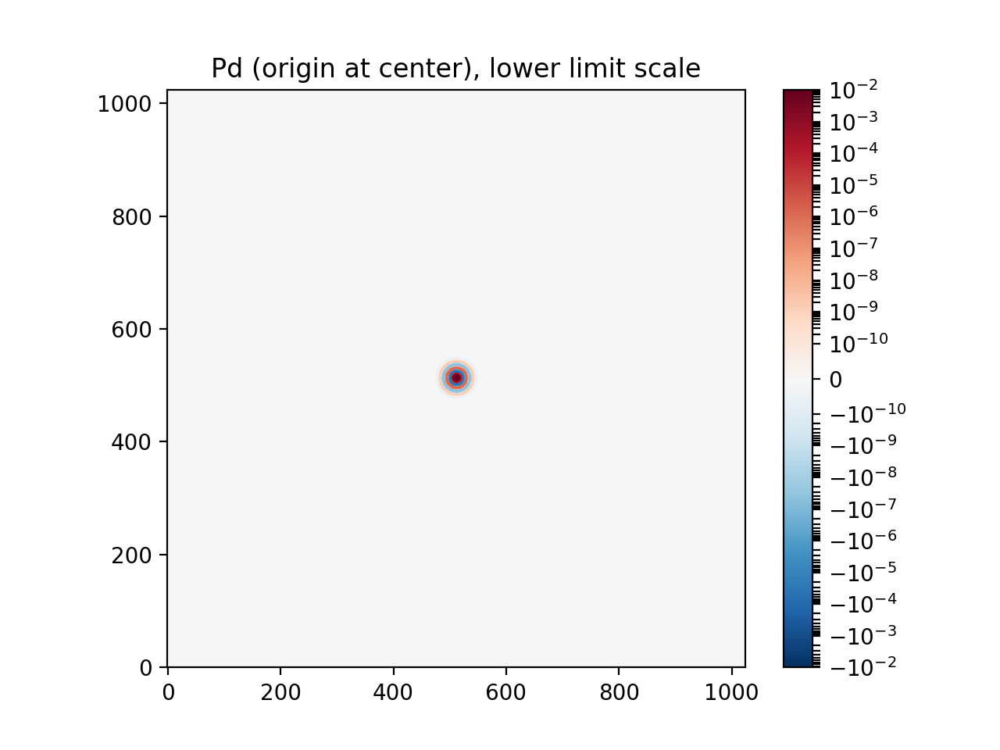

Text(0.5, 1.0, 'Pd (origin at center), lower limit scale')

In [58]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
P2 = task.padCenterOriginArray(Pd, (1024,1024), useInverse=True)
cs = ax.imshow(P2, interpolation='none', origin='lower', cmap='RdBu_r',
               norm=matplotlib.colors.SymLogNorm(base=10, linthresh=1e-10,vmin=-0.01,vmax=0.01))
fig.colorbar(cs)
ax.set_title("Pd (origin at center), lower limit scale")